<a href="https://colab.research.google.com/github/kumar-devesh/cycleGAN/blob/main/cyclegan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import itertools
import PIL
from tqdm import tqdm
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision 
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from torchvision import transforms

In [ ]:
batch_size = 8
dir_path='/content/drive/MyDrive/Colab Notebooks/cyclegan'

In [ ]:
!nvidia-smi

Mon Sep 13 11:49:09 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.63.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   65C    P0    62W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## DATASET

In [ ]:
def plotImage(image):
  image = np.array(image)
  plt.imshow(np.transpose(image,(1,2,0)))

In [ ]:
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader

In [ ]:
def normalize_image(image):
  mean = (0,0,0)
  std = (1,1,1)
  brightness, contrast, saturation, hue = 0.25*np.random.random_sample((4,))
  transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.ColorJitter(brightness= brightness, contrast=contrast, saturation=saturation, hue=hue),
    transforms.Normalize(mean, std)])
  return transform(image)

In [ ]:
class horse(Dataset):
    def __init__(self, img_dir):
        self.img_dir = img_dir
        self.img_list = os.listdir(img_dir)

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_list[idx])
        image = Image.open(img_path)
        image = np.array(image)/255
        image = normalize_image(image) # do not apply transpose if applying normalization
        #image = np.transpose(image,(2,0,1))
        image = torch.tensor(image, dtype=torch.float32, requires_grad=False)
        return image

In [ ]:
class zebra(Dataset):
    def __init__(self, img_dir):
        self.img_dir = img_dir
        self.img_list = os.listdir(img_dir)

    def __len__(self):
        return len(self.img_list)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_list[idx])
        image = Image.open(img_path)
        image = np.array(image)/255
        image = normalize_image(image) # do not apply transpose if applying normalization
        #image = np.transpose(image,(2,0,1))
        image = torch.tensor(image, dtype=torch.float32, requires_grad=False)
        return image

In [ ]:
data_path = os.path.join(dir_path, 'horse2zebra(128*128)')

In [ ]:
train_image_path= os.path.join(data_path, "trainA")
horse_train = horse(img_dir=train_image_path) #dataset

In [ ]:
train_image_path= os.path.join(data_path, "trainB")
zebra_train = zebra(img_dir=train_image_path) #dataset

In [ ]:
horse_dataloader = DataLoader(horse_train, batch_size, shuffle=True, num_workers=2)
zebra_dataloader = DataLoader(zebra_train, batch_size, shuffle=True, num_workers=2)

In [ ]:
def plotGrid(train_images):
  images = train_images[0:8]
  img_grid = torchvision.utils.make_grid(images, nrow=4)
  img_grig = np.array(img_grid)
  img_grid = np.transpose(img_grid,(1,2,0))
  plt.imshow(img_grid)

In [ ]:
horse_images = next(iter(horse_dataloader))
print(f"Feature batch shape: {horse_images.size()}")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app


Feature batch shape: torch.Size([8, 3, 128, 128])


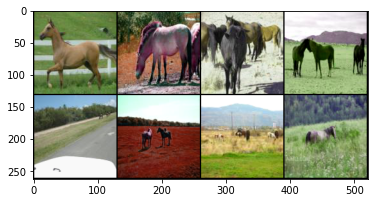

In [ ]:
plotGrid(horse_images)

In [ ]:
zebra_images = next(iter(zebra_dataloader))
print(f"Feature batch shape: {zebra_images.size()}")

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app


Feature batch shape: torch.Size([8, 3, 128, 128])


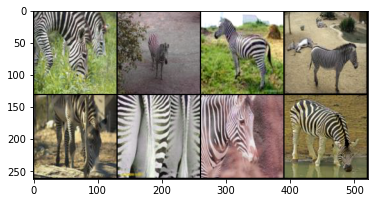

In [ ]:
plotGrid(zebra_images)

In [ ]:
def get_horse_images():
  return next(iter(horse_dataloader))

def get_zebra_images():
  return next(iter(zebra_dataloader))

## MODEL

In [ ]:
class inConv(nn.Module):
  def __init__(self, in_channels, out_channels):
    """ Convolution block for Generator input image (without the instance norm layers) """
    super(inConv, self).__init__()
    self.conv = nn.Sequential(
        nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=True),
        nn.LeakyReLU(negative_slope=0.2, inplace=True),

        nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=True),
        nn.LeakyReLU(negative_slope=0.2, inplace=True),)
    
  def forward(self, x):
    return self.conv(x)


In [ ]:
class ConvBlock(nn.Module):
  def __init__(self, in_channels, out_channels):
    """ Convolution block for Generator """
    super(ConvBlock, self).__init__()
    self.conv = nn.Sequential(
        nn.Conv2d(in_channels, out_channels//4, kernel_size=1, padding=0, bias=False),
        nn.InstanceNorm2d(num_features=out_channels//4),
        nn.LeakyReLU(negative_slope=0.2, inplace=True),

        nn.Conv2d(out_channels//4, out_channels//4, kernel_size=3, padding=1, bias=False),
        nn.InstanceNorm2d(num_features=out_channels//4),
        nn.LeakyReLU(negative_slope=0.2, inplace=True),

        nn.Conv2d(out_channels//4, out_channels//4, kernel_size=3, padding=1, bias=False),
        nn.InstanceNorm2d(num_features=out_channels//4),
        nn.LeakyReLU(negative_slope=0.2, inplace=True),

        nn.Conv2d(out_channels//4, out_channels, kernel_size=1, padding=0, bias=False),
        nn.InstanceNorm2d(num_features=out_channels),
        nn.LeakyReLU(negative_slope=0.2, inplace=True),)
    
  def forward(self, x):
    return self.conv(x)


In [ ]:
class up(nn.Module):
  def __init__(self, in_channels, out_channels):
    """ Upsample feature maps """
    super(up, self).__init__()
    self.up = nn.ConvTranspose2d(in_channels , out_channels, kernel_size=2, stride=2)
    self.conv = ConvBlock(in_channels, out_channels)

  def forward(self, x1, x2):
    x1 = self.up(x1)
    x = torch.cat([x2, x1], dim=1) #concatenate along channel dim
    return self.conv(x)


In [ ]:
class down(nn.Module):
  def __init__(self, in_channels, out_channels):
    """ Downsample feature maps """
    super(down, self).__init__()
    self.conv = nn.Sequential(
        ConvBlock(in_channels, out_channels),
        nn.MaxPool2d(kernel_size=2,stride=2),
    )
  def forward(self, x):
    return self.conv(x)

In [ ]:
class outConv(nn.Module):
  def __init__(self, in_channels, out_channels):
    super(outConv, self).__init__()
    self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

  def forward(self, x):
    x=self.conv(x)
    return F.tanh(x)

In [ ]:
# Unet generator with 128*128*3 inputs
class Generator(nn.Module):
  def __init__(self, in_channels, out_channels):
    """ generator model"""
    super(Generator, self).__init__()
    self.ic = inConv(in_channels, 64)
    self.d1 = down(64, 128)
    self.d2 = down(128, 256)
    self.d3 = down(256, 512)
    self.d4 = down(512, 1024)
    self.u1 = up(1024, 512)
    self.u2 = up(512, 256)
    self.u3 = up(256, 128)
    self.u4 = up(128, 64)
    self.oc = outConv(64, out_channels)

  def forward(self, x):
    x1 = self.ic(x)
    x2 = self.d1(x1)
    x3 = self.d2(x2)
    x4 = self.d3(x3)
    x5 = self.d4(x4)
    x = self.u1(x5, x4)
    x = self.u2(x, x3)
    x = self.u3(x, x2)
    x = self.u4(x, x1)
    x = self.oc(x)
    return x

In [ ]:
# a patch based discriminator where each neuron looks at an image patch
class Discriminator(nn.Module):
  def __init__(self, n_layers=3):
    super(Discriminator, self).__init__()
    ch = 8
    self.conv = [nn.Conv2d(in_channels=3, out_channels=ch, kernel_size=4, stride=1, padding=0), 
                nn.LeakyReLU(0.2, True)]

    for i in range(n_layers):
      self.conv += [nn.Conv2d(in_channels=ch,out_channels=2*ch ,kernel_size=4 ,stride=1, padding=0),
                    nn.LeakyReLU(0.2, True),
                  nn.InstanceNorm2d(num_features=2*ch),nn.LeakyReLU(0.2, True),

                  nn.Conv2d(in_channels=2*ch,out_channels=4*ch ,kernel_size=4 ,stride=2, padding=1),
                  nn.LeakyReLU(0.2, True),
                  nn.InstanceNorm2d(num_features=4*ch),nn.LeakyReLU(0.2, True)]
      ch*=4
    self.convblock = nn.Sequential(*self.conv)
    self.onechannel = nn.Conv2d(in_channels=ch, out_channels=1, kernel_size=13)

  def forward(self, x):
    x=self.convblock(x)
    x=self.onechannel(x)
    return x

## Tensorboard

In [ ]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter('runs/exp_1')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construc

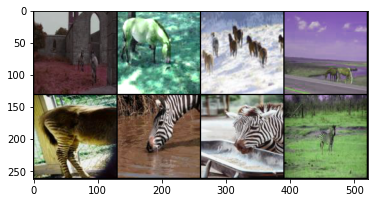

In [ ]:
horse_images = get_horse_images()
zebra_images = get_zebra_images()
images = [*horse_images[0:4], *zebra_images[0:4]]
img_grid = torchvision.utils.make_grid(images, nrow=4)
img_grig = np.array(img_grid)
img_grid = np.transpose(img_grid,(1,2,0))
plt.imshow(img_grid)

In [ ]:
img_grid = torchvision.utils.make_grid(images, nrow=4)
writer.add_image('images', img_grid)

In [ ]:
class GAN(nn.Module):
  def __init__(self):
    super(GAN, self).__init__()
    self.conv = nn.Sequential(Generator(in_channels=3, out_channels=3),
                              Discriminator(n_layers = 3))
  def forward(self, x):
    return self.conv(x)

In [ ]:
gan = GAN()

In [ ]:
horse_images = np.array(get_horse_images())
zebra_images = np.array(get_zebra_images())

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  from ipykernel import kernelapp as app
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:15: UserWarning: To copy construc

In [ ]:
images = list([*horse_images[0:4], *zebra_images[0:4]])

In [ ]:
images = np.array(images)
images = torch.tensor(images, requires_grad = False)

In [ ]:
writer.add_graph(gan, images)

/usr/local/lib/python3.7/dist-packages/torch/nn/functional.py:718: UserWarning: Named tensors and all their associated APIs are an experimental feature and subject to change. Please do not use them for anything important until they are released as stable. (Triggered internally at  /pytorch/c10/core/TensorImpl.h:1156.)
  return torch.max_pool2d(input, kernel_size, stride, padding, dilation, ceil_mode)


In [ ]:
%load_ext tensorboard
%tensorboard --logdir=runs

<IPython.core.display.Javascript object>

## Loss

In [ ]:
a=-1 #fake label
b=1 #real label
c=0 
def LS_loss(D_real_images = 0, D_generated_images = 0, generator_loss = True):
  if generator_loss == True:
    loss = (1/2)*batch_size*((D_generated_images-c)**2)
  else:
    loss = (1/2)*batch_size*((D_real_images-b)**2+(D_generated_images-a)**2)
  return torch.mean(loss)

In [ ]:
def cycle_loss(real_images, generated_images):
  return torch.mean(torch.abs(real_images-generated_images))

## Train

domain x - horse

domain y - zebra

Gxy - horse to zebra

Gyx - zebra to horse

Dx - discriminator for horse images

Dy - discriminator for zebra images

In [ ]:
Gxy = Generator(in_channels=3, out_channels=3)
Gyx = Generator(in_channels=3, out_channels=3)
Dx = Discriminator(n_layers = 3)
Dy = Discriminator(n_layers = 3)

In [ ]:
PATH = '/content/drive/MyDrive/Colab Notebooks'

In [ ]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [ ]:
checkpoint = torch.load(os.path.join(PATH, 'cyclegan_model.pth'), map_location = device)
Gxy.load_state_dict(checkpoint['Gxy_state_dict'])
Gyx.load_state_dict(checkpoint['Gyx_state_dict'])
Dx.load_state_dict(checkpoint['Dx_state_dict'])
Dy.load_state_dict(checkpoint['Dy_state_dict'])

<All keys matched successfully>

In [ ]:
Gxy = Gxy.to(device)
Gyx = Gyx.to(device)
Dx = Dx.to(device)
Dy = Dy.to(device)

### model summaries

In [ ]:
from torchvision import models
from torchsummary import summary

In [ ]:
summary(Gxy, (3,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           1,792
         LeakyReLU-2         [-1, 64, 128, 128]               0
            Conv2d-3         [-1, 64, 128, 128]          36,928
         LeakyReLU-4         [-1, 64, 128, 128]               0
            inConv-5         [-1, 64, 128, 128]               0
            Conv2d-6         [-1, 32, 128, 128]           2,048
    InstanceNorm2d-7         [-1, 32, 128, 128]               0
         LeakyReLU-8         [-1, 32, 128, 128]               0
            Conv2d-9         [-1, 32, 128, 128]           9,216
   InstanceNorm2d-10         [-1, 32, 128, 128]               0
        LeakyReLU-11         [-1, 32, 128, 128]               0
           Conv2d-12         [-1, 32, 128, 128]           9,216
   InstanceNorm2d-13         [-1, 32, 128, 128]               0
        LeakyReLU-14         [-1, 32, 1

In [ ]:
# 2 objects generator,discriminator objects- horse,zebra 

In [ ]:
summary(Dx, (3,128,128))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1          [-1, 8, 125, 125]             392
         LeakyReLU-2          [-1, 8, 125, 125]               0
            Conv2d-3         [-1, 16, 122, 122]           2,064
         LeakyReLU-4         [-1, 16, 122, 122]               0
    InstanceNorm2d-5         [-1, 16, 122, 122]               0
         LeakyReLU-6         [-1, 16, 122, 122]               0
            Conv2d-7           [-1, 32, 61, 61]           8,224
         LeakyReLU-8           [-1, 32, 61, 61]               0
    InstanceNorm2d-9           [-1, 32, 61, 61]               0
        LeakyReLU-10           [-1, 32, 61, 61]               0
           Conv2d-11           [-1, 64, 58, 58]          32,832
        LeakyReLU-12           [-1, 64, 58, 58]               0
   InstanceNorm2d-13           [-1, 64, 58, 58]               0
        LeakyReLU-14           [-1, 64,

### train

In [ ]:
lr = 0.0002
beta1 = 0.5
beta2 = 0.999

In [ ]:
optimizer_G = torch.optim.Adam(itertools.chain(Gxy.parameters(), Gyx.parameters()), lr= lr, betas=(beta1, beta2))
optimizer_D = torch.optim.Adam(itertools.chain(Dx.parameters(), Dy.parameters()), lr= lr, betas=(beta1, beta2))

In [ ]:
def get_gradient_norm(model):
  for p in model.parameters():
    param_norm = p.grad.detach().data.norm(2)
    total_norm += param_norm.item()**2
  total_norm = total_norm**0.5
  return total_norm

In [ ]:
def add_images_to_tensorboard(iteration):
  zebra_images = Gxy(get_horse_images().to(device)).clone().detach().to('cpu')
  horse_images = Gyx(get_zebra_images().to(device)).clone().detach().to('cpu')
  images = [*horse_images[0:4], *zebra_images[0:4]]
  img_grid = torchvision.utils.make_grid(images, nrow=4)
  writer.add_image('image-generated at epoch'+str(epoch), img_grid)

In [ ]:
def train(epoch, lambda_cyc=10, k=1, iterations = 125):
  for iteration in range(iterations):
    #Update the Discriminators k steps
    x = 125*epoch + iteration
    for i in range(k):
      optimizer_D.zero_grad()

      real_x = get_horse_images().clone().detach().to(device)
      adversarial_loss = LS_loss(D_real_images = Dx(real_x), D_generated_images = Dy(Gxy(real_x)), generator_loss = False)
      adversarial_loss.backward(retain_graph=False, create_graph=False)

      #add loss for Dx on real + Dy on generated
      writer.add_scalar("Loss/train/Dx on real + Dy on generated", adversarial_loss, x)

      real_y = get_zebra_images().clone().detach().to(device)
      adversarial_loss = LS_loss(D_real_images = Dy(real_y), D_generated_images = Dx(Gyx(real_y)), generator_loss = False)
      adversarial_loss.backward(retain_graph=False, create_graph=False)

      #add loss for Dy on real + Dx on generated
      writer.add_scalar("Loss/train/Dy on real + Dx on generated", adversarial_loss, x)

      optimizer_D.step() #update weights

    # Update the Generators 1 step
    optimizer_G.zero_grad()

    # sample from Domain X ->cycle loss
    real_x = get_horse_images().clone().detach().to(device)
    loss = lambda_cyc*cycle_loss(real_x, Gyx(Gxy(real_x)))
    loss.backward(retain_graph=False, create_graph=False)

    #add cycle_loss for horse
    writer.add_scalar("Loss/train/loss_cycle_horse", loss, x)

    # sample from Domain Y ->cycle loss
    real_y = get_zebra_images().clone().detach().to(device)
    loss = lambda_cyc*cycle_loss(real_y, Gxy(Gyx(real_y)))
    loss.backward(retain_graph=False, create_graph=False)

    #add cycle_loss for zebra
    writer.add_scalar("Loss/train/loss_cycle_zebra", loss, x)

    # adversarial losses for both generators
    real_x = get_horse_images().clone().detach().to(device)
    adversarial_loss = LS_loss(D_real_images = 0, D_generated_images = Dy(Gxy(real_x)), generator_loss = True)
    adversarial_loss.backward(retain_graph=False, create_graph=False)

    #add adversarial_loss for Gxy
    writer.add_scalar("Loss/train/Gxy", adversarial_loss, x)

    real_y = get_zebra_images().clone().detach().to(device)
    adversarial_loss = LS_loss(D_real_images = 0, D_generated_images = Dx(Gyx(real_y)), generator_loss = True)
    adversarial_loss.backward(retain_graph=False, create_graph=False)

    #add adversarial_loss for Gyx
    writer.add_scalar("Loss/train/Gyx", adversarial_loss, x)

    # nn.utils.clip_grad_norm_(Gxy.parameters(), max_norm=0.01, norm_type=2.0)
    # nn.utils.clip_grad_norm_(Gyx.parameters(), max_norm=0.01, norm_type=2.0)

    optimizer_G.step() #update weights

In [ ]:
num_epochs = 100

In [ ]:
for epoch in tqdm(range(num_epochs)):
  add_images_to_tensorboard(epoch)
  train(epoch = epoch, lambda_cyc=10, k=1, iterations = 125)
  torch.save({'Gxy_state_dict': Gxy.state_dict(),
            'Gyx_state_dict': Gyx.state_dict(),
            'Dx_state_dict': Dx.state_dict(),
            'Dy_state_dict': Dy.state_dict()}, os.path.join(PATH, 'cyclegan_model.pth'))
  torch.cuda.empty_cache()

## save model weights

In [ ]:
torch.save({'Gxy_state_dict': Gxy.state_dict(),
            'Gyx_state_dict': Gyx.state_dict(),
            'Dx_state_dict': Dx.state_dict(),
            'Dy_state_dict': Dy.state_dict()}, os.path.join(PATH, 'cyclegan_model.pth'))

In [ ]:
horse_images = get_horse_images()
images = Gxy(horse_images.to(device)).detach().clone().to('cpu')

In [ ]:
img_grid = torchvision.utils.make_grid(images, nrow=4)
img_grig = np.array(img_grid)
img_grid = np.transpose(img_grid,(1,2,0))
plt.imshow(img_grid)

In [ ]:
horse_images = horse_images.to('cpu')

In [ ]:
img_grid = torchvision.utils.make_grid(horse_images, nrow=4)
img_grig = np.array(img_grid)
img_grid = np.transpose(img_grid,(1,2,0))
plt.imshow(img_grid)
# horse images from dataset

In [ ]:
zebra_images = get_zebra_images()
images = Gyx(zebra_images.to(device)).detach().clone().to('cpu')

In [ ]:
img_grid = torchvision.utils.make_grid(images, nrow=4)
img_grig = np.array(img_grid)
img_grid = np.transpose(img_grid,(1,2,0))
plt.imshow(img_grid)

In [ ]:
zebra_images = zebra_images.to('cpu')

In [ ]:
img_grid = torchvision.utils.make_grid(zebra_images, nrow=4)
img_grig = np.array(img_grid)
img_grid = np.transpose(img_grid,(1,2,0))
plt.imshow(img_grid)
# zebra image from dataset

In [ ]:
images = Gxy(zebra_images.to(device)).detach().clone().to('cpu')
img_grid = torchvision.utils.make_grid(images, nrow=4)
img_grig = np.array(img_grid)
img_grid = np.transpose(img_grid,(1,2,0))
plt.imshow(img_grid) 
# Gxy with zebra image input

In [ ]:
images = Gyx(horse_images.to(device)).detach().clone().to('cpu')
img_grid = torchvision.utils.make_grid(images, nrow=4)
img_grig = np.array(img_grid)
img_grid = np.transpose(img_grid,(1,2,0))
plt.imshow(img_grid) 
# Gyx with horse image input